<a href="https://colab.research.google.com/github/thalisrocha/Intro-to-image-processing1/blob/main/TP1_12_09_THALIS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## SECTION 1


In [2]:
#%% SECTION 1 inclusion de packages externes


import numpy as np
import skimage.io
import platform
import tempfile
import os
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
# necessite scikit-image
from skimage import io as skio


## SECTION 2

In [3]:
#%% SECTION 2 fonctions utiles pour le TP

def viewimage(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI et MAXI seront mis a 0 et 255 dans l'image resultat

    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' '
    elif platform.system()=='Windows':
        #ou windows ; probleme : il faut fermer gimp pour reprendre la main;
        #si vous savez comment faire (commande start ?) je suis preneur
        prephrase='"C:/Program Files/GIMP 2/bin/gimp-2.10.exe" '
        endphrase=' '
    else: #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais pas comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'

    if normalise:
        m=im.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M

    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1

    nomfichier=tempfile.mktemp('TPIMA.png')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)

def viewimage_color(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI(defaut 0) et MAXI (defaut 255) seront mis a 0 et 255 dans l'image resultat

    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase= ' '
    elif platform.system()=='Windows':
        #ou windows ; probleme : il faut fermer gimp pour reprendre la main;
        #si vous savez comment faire (commande start ?) je suis preneur
        prephrase='"C:/Program Files/GIMP 2/bin/gimp-2.10.exe"'
        endphrase=' '
    else: #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase=' &'

    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M
    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1

    nomfichier=tempfile.mktemp('TPIMA.pgm')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)

def noise(im,br):
    """ Cette fonction ajoute un bruit blanc gaussier d'ecart type br
       a l'image im et renvoie le resultat"""
    imt=np.float32(im.copy())
    sh=imt.shape
    bruit=br*np.random.randn(*sh)
    imt=imt+bruit
    return imt

def quantize(im,n=2):
    """
    Renvoie une version quantifiee de l'image sur n (=2 par defaut) niveaux
    """
    imt=np.float32(im.copy())
    if np.floor(n)!= n or n<2:
        raise Exception("La valeur de n n'est pas bonne dans quantize")
    else:
        m=imt.min()
        M=imt.max()
        imt=np.floor(n*((imt-m)/(M-m)))*(M-m)/n+m
        imt[imt==M]=M-(M-m)/n #cas des valeurs maximales
    return imt


def seuil(im,s):
    """ renvoie une image blanche(255) la ou im>=s et noire (0) ailleurs.
    """
    imt=np.float32(im.copy())
    mask=imt<s
    imt[mask]=0
    imt[~mask]=255
    return imt

def gradx(im):
    "renvoie le gradient dans la direction x"
    imt=np.float32(im)
    gx=0*imt
    gx[:,:-1]=imt[:,1:]-imt[:,:-1]
    return gx

def grady(im):
    "renvoie le gradient dans la direction y"
    imt=np.float32(im)
    gy=0*imt
    gy[:-1,:]=imt[1:,:]-imt[:-1,:]
    return gy

def view_spectre(im,option=1,hamming=False):
    """ affiche le spectre d'une image
     si option =1 on affiche l'intensite de maniere lineaire
     si option =2 on affiche le log
     si hamming=True (defaut False) alors une fenetre de hamming est appliquee avant de prendre la transformee de Fourier
     """
    imt=np.float32(im.copy())
    (ty,tx)=im.shape
    pi=np.pi
    if hamming:
        XX=np.ones((ty,1))@(np.arange(0,tx).reshape((1,tx)))
        YY=(np.arange(0,ty).reshape((ty,1)))@np.ones((1,tx))
        imt=(1-np.cos(2*pi*XX/(tx-1)))*(1-np.cos(2*pi*YY/(ty-1)))*imt
    aft=np.fft.fftshift(abs(np.fft.fft2(imt)))
    if option==1:
        #viewimage(aft)
        return aft
    else:
        #viewimage(np.log(0.1+aft))
        return np.log(0.1+aft)


def filterlow(im):
    """applique un filtre passe-bas parfait a une image (taille paire)"""
    (ty,tx)=im.shape
    imt=np.float32(im.copy())
    pi=np.pi
    XX=np.concatenate((np.arange(0,tx/2+1),np.arange(-tx/2+1,0)))
    XX=np.ones((ty,1))@(XX.reshape((1,tx)))

    YY=np.concatenate((np.arange(0,ty/2+1),np.arange(-ty/2+1,0)))
    YY=(YY.reshape((ty,1)))@np.ones((1,tx))
    mask=(abs(XX)<tx/4) & (abs(YY)<ty/4)
    imtf=np.fft.fft2(imt)
    imtf[~mask]=0
    return np.real(np.fft.ifft2(imtf))

def filtergauss(im):
    """applique un filtre passe-bas gaussien. coupe approximativement a f0/4"""
    (ty,tx)=im.shape
    imt=np.float32(im.copy())
    pi=np.pi
    XX=np.concatenate((np.arange(0,tx/2+1),np.arange(-tx/2+1,0)))
    XX=np.ones((ty,1))@(XX.reshape((1,tx)))

    YY=np.concatenate((np.arange(0,ty/2+1),np.arange(-ty/2+1,0)))
    YY=(YY.reshape((ty,1)))@np.ones((1,tx))
    # C'est une gaussienne, dont la moyenne est choisie de sorte que
    # l'integrale soit la meme que celle du filtre passe bas
    # (2*pi*sig^2=1/4*x*y (on a suppose que tx=ty))
    sig=(tx*ty)**0.5/2/(pi**0.5)
    mask=np.exp(-(XX**2+YY**2)/2/sig**2)
    imtf=np.fft.fft2(imt)*mask
    return np.real(np.fft.ifft2(imtf))

**2)**

**2.1 Zooms**

*Ouvrez une image de votre choix dans gimp ( viewimage ). Zoomez-la d’un facteur 2 ou plus (menu
déroulant "%" sous l’image) pour la visualiser en plus grand. Que fait gimp pour afficher l’image en
plus grand?*

**Réponse:** Pour zoomer une image le Gimp applique une méthode d'interpolation dans le but de calculer la valeur des pixels qui ne font pas partie de la grille d'origine.

*Ouvrir l’image maison.tif et réduisez sa taille par le menu "Image -> Echelle..." d’un facteur deux. Attention: Dans le dialogue "Echelle..." sélectionner "Aucune" comme méthode d’interpolation. Zoomez-là pour l’afficher en deux fois plus grand. Ouvrez l’image maison_petit tif et zoomez-la d’un facteur 2 également. Comparez le résultat par rapport au zoom de la petite image que vous avez produite.*

*Quelle hypothèse pouvez-vous faire sur la génération de maison_petit.tif?*


**Réponse:** En observant les deux images il est possible de constater que l'image 'maison_petite.tif' après le zoom de facteur 2 présente un meilleur résultat par rapport à l'image 'maison.tif'.

La diminution de la taille de 'maison.tif' provoque un sous-échantillonnage, de façon qu'un pixel sur l'image réduite représente une surface plus grande qu'un pixel sur l'image d'origine (d'après le théorème d’échantillonnage de Shannon). Ainsi, losrque l'image 'maison.tif' est dézommé et zoomé, le résultat de cette mauvaise approximation devient visible.

Il faut avant le dézoom apliquer un filtre passe-bas à l'image, ce qui a probablement été fait à l'image 'maison-petite.tif', compte tenu de ses meilleurs résultats.

**2.2 Espace couleurs**





*Ouvrir l’image fleur.tif(commande viewimage_color ). Ouvrir le dialogue "Couleurs->Teinte-Saturation".
Essayez de transformer les fleurs jaunes en fleurs bleues avec le bouton Hue. Comprenez-vous pourquoi
les deux positions extrêmes de ce boutons font, en fait, la même transformation?*

*A quoi correspond la saturation (essayez-100% et +100%)?*

**Réponse:** Étant donné l'espace couleurs, les deux positions extrêmes du bouton "Hue" corréspondent aux mêmes valeurs des angles du cercle des couleurs (0,2π).

La saturation indique le niveau de "pureté" de la couleur. Pour une saturation +100% les couleurs dans l'image sont plus intenses, alors que pour une saturation de -100% l'image est en niveau de gris.


**3)**

**3.1 Histogramme**

*Pour afficher l’histogramme d’une image on utilise la fonction plt.hist(im.reshape((-1,)),bins=N), N
étant le nombre de cases, voir l’exemple donné dans tp_initiation.py. Il faut préalablement convertir l’image en flottant im=np.float32(im) . Commencez par visualiser quelques histogrammes d’images
de votre choix. Pour une image couleur, vous pouvez visualiser les histogrammes de l’un des canaux
couleur. Pour extraire le canal rouge d’une image couleur imcol on peut procéder ainsi rouge=imcol[:,:,1] .
Vous pouvez aussi visualiser l’histogramme de l’image obtenue en moyennant les canaux couleur
im=imcol.mean(axis=2). Visualisez ensuite l’histogramme cumulé (noté H en cours):*

Text(0.5, 1.0, 'Histogramme Cumulé')

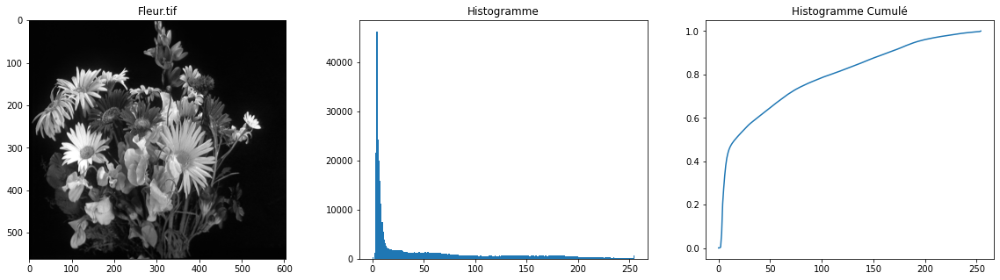

In [ ]:
## Histogramme

im3=skio.imread('fleur.tif')
im3=np.float32(im3)
im3=im3.mean(axis=2)

## Histogramme Cumulé

(histo,bins)=np.histogram(im3.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum=histo.cumsum()

## Plot

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(im3.astype("uint8"), cmap="gray")
axs[1].hist(im3.reshape((-1,)),bins=255)
axs[2].plot(histocum)
axs[0].set_title('Fleur.tif')
axs[1].set_title('Histogramme')
axs[2].set_title('Histogramme Cumulé')


Text(0.5, 1.0, 'Histogramme Cumulé')

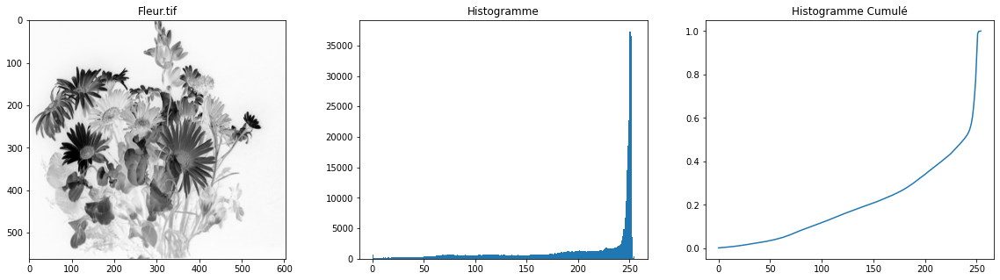

In [ ]:
## Histogramme

im3=skio.imread('fleur.tif')
im3=np.float32(im3)
im3=255-im3.mean(axis=2)

## Histogramme Cumulé

(histo,bins)=np.histogram(im3.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum=histo.cumsum()

## Plot

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(im3.astype("uint8"), cmap="gray")
axs[1].hist(im3.reshape((-1,)),bins=255)
axs[2].plot(histocum)
axs[0].set_title('Fleur.tif')
axs[1].set_title('Histogramme')
axs[2].set_title('Histogramme Cumulé')


*Nous étudions maintenant l’effet de dégradations simples des images sur leur histogramme. A
l’aide de la fonction noise , ajoutez un bruit gaussien à une image et étudiez l’effet produit sur son
histogramme.*

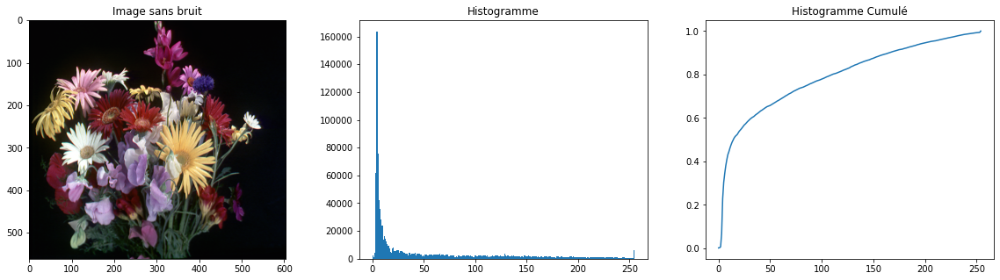

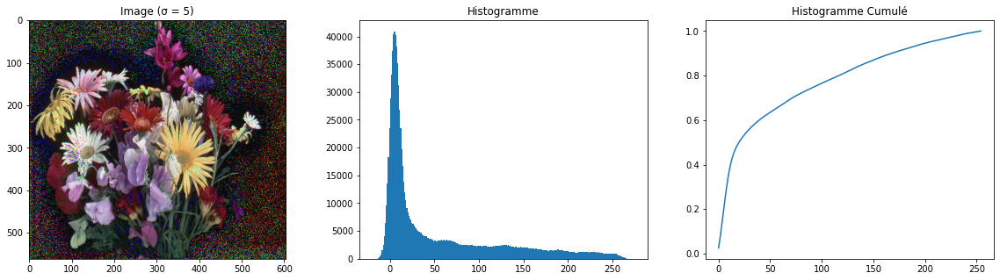

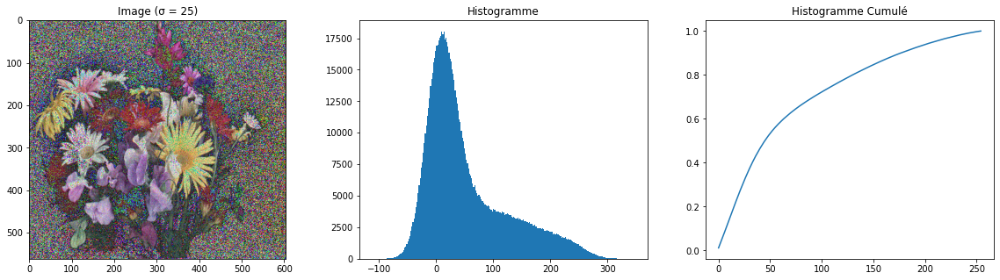

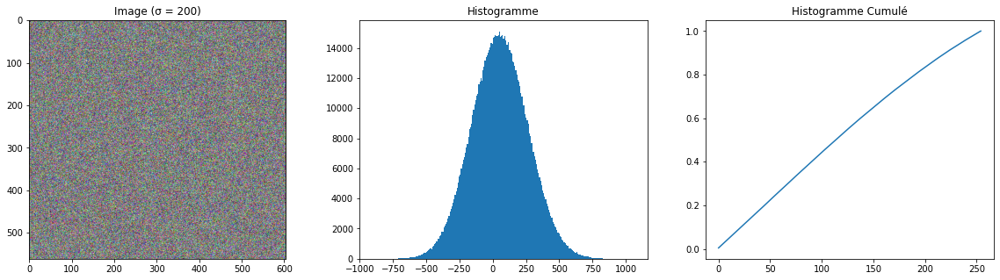

In [ ]:
## Sans bruit

im3=skio.imread('fleur.tif')
im3=np.float32(im3)

(histo,bins)=np.histogram(im3.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum=histo.cumsum()

## Plot

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(im3.astype("uint8"))
axs[1].hist(im3.reshape((-1,)),bins=255)
axs[2].plot(histocum)
axs[0].set_title('Image sans bruit')
axs[1].set_title('Histogramme')
axs[2].set_title('Histogramme Cumulé')

fig.savefig('3_11.png', bbox_inches="tight")

## Avec bruit gaussien (br = 5)

im3_noise = noise(im3,5)

(histo,bins)=np.histogram(im3_noise.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum=histo.cumsum()

## Plot

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(im3_noise.astype("uint8"))
axs[1].hist(im3_noise.reshape((-1,)),bins=255)
axs[2].plot(histocum)
axs[0].set_title('Image (σ = 5)')
axs[1].set_title('Histogramme')
axs[2].set_title('Histogramme Cumulé')

fig.savefig('3_12.png', bbox_inches="tight")

## Avec bruit gaussien (br = 25)

im3=skio.imread('fleur.tif')
im3_noise = noise(im3,25)

im3=np.float32(im3)
im3=im3.mean(axis=2)

(histo,bins)=np.histogram(im3_noise.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum=histo.cumsum()

## Plot

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(im3_noise.astype("uint8"), cmap="gray")
axs[1].hist(im3_noise.reshape((-1,)),bins=255)
axs[2].plot(histocum)
axs[0].set_title('Image (σ = 25)')
axs[1].set_title('Histogramme')
axs[2].set_title('Histogramme Cumulé')

fig.savefig('3_13.png', bbox_inches="tight")


## Avec bruit gaussien (br = 200)

im3=skio.imread('fleur.tif')
im3_noise = noise(im3,200)

im3=np.float32(im3)
im3=im3.mean(axis=2)

(histo,bins)=np.histogram(im3_noise.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum=histo.cumsum()

## Plot

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(im3_noise.astype("uint8"), cmap="gray")
axs[1].hist(im3_noise.reshape((-1,)),bins=255)
axs[2].plot(histocum)
axs[0].set_title('Image (σ = 200)')
axs[1].set_title('Histogramme')
axs[2].set_title('Histogramme Cumulé')

fig.savefig('3_14.png', bbox_inches="tight")



*En considérant les niveaux de gris d’une image comme la réalisation d’une variable aléatoire dont
la loi est l’histogramme de l’image, interprétez le résultat.*


Réponse: En observant les images ci-dessus il est possible de constater que dans la mesure où le bruit gaussien blanc est ajouté à l'image, l'histogramme resultant se ressemblet de plus en plus à une courbe gaussienne, ainsi que l'histogramme cumulé devient linéaire.

En sachant que l'histogramme d'une image est la loi décrivant le comportement d'une variable aléatoire, lorsqu'on ajoute du bruit gaussien à l'image, **soient** l'image et le bruit des variables aléatoires indépendantes, l'histogramme résultant est l'histogramme de l'image originale convolué avec une gaussienne centrée (μ = 0) d'écart type σ (br ~ 𝒩(0,σ²)).

Par conséquence, l'augmentation de l'écart donne un histogramme de plus en plus similaire à la courbe gaussienne.



**3.2 Changement de Contraste (GIMP)**


*L’outils "Courbes" de Gimp (dans le menu "Couleurs"), permet de prescrire "à la main" un changement de contraste à appliquer à l’image (ainsi que de voir en gris clair l’histogramme de l’image). L’aspect global de l’image est-il modifié par l’application de fonctions croissantes ? Que se passe-t-il si l’on applique une transformation non-croissante des niveaux de gris?*

**Réponse:** L’application de fonctions croissantes change peu l’aspect global de l’image, la perception du contenu varie peu face à un changement perceptible de la luminosité.

L’application de fonctions non-croissantes, par contre, provoque un changement considérable de la perception des objets. Certaines régions de l’image sont plus soulignées que d’autres, alors que la perception des objets est fortement modifiée.


**3.3 Égalisation d'histogramme**

*L'égalisation d'histogramme consiste à utiliser comme changement de contraste l'histogramme cumulé de l'image traitée. Visualisez son effet (par exemple sur l'image sombre.jpg) en reprenant l'histogramme cumulé histocum calculé précédemment*

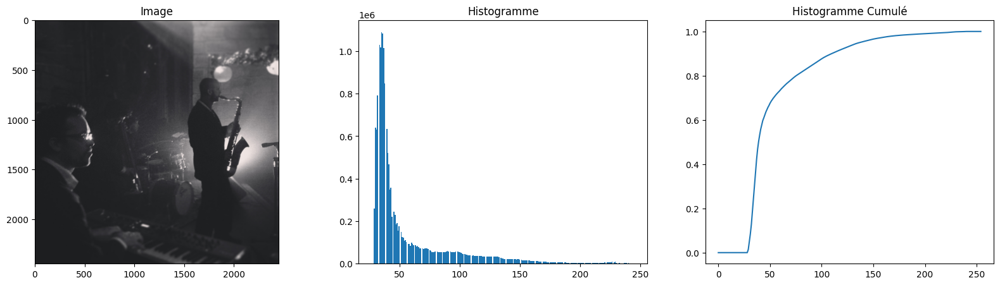

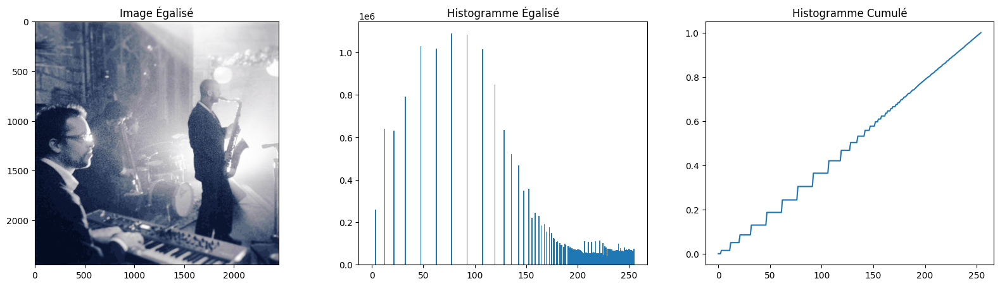

In [4]:
im3_3=skio.imread('sombre.jpg')

(histo,bins)=np.histogram(im3_3.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum=histo.cumsum()

imequal = histocum[np.uint8(im3_3)]*255

(histo,bins)=np.histogram(imequal.reshape((-1,)),np.arange(0,256))
histo=histo/histo.sum()
histocum_equal=histo.cumsum()

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(im3_3.astype("uint8"), cmap="gray")
axs[1].hist(im3_3.reshape((-1,)),bins=255)
axs[2].plot(histocum)
axs[0].set_title('Image')
axs[1].set_title('Histogramme')
axs[2].set_title('Histogramme Cumulé')

fig.savefig('3_31.png', bbox_inches="tight")

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].imshow(imequal.astype("uint8"), cmap="gray")
axs[1].hist(imequal.reshape((-1,)),bins=255)
axs[2].plot(histocum_equal)
axs[0].set_title('Image Égalisé')
axs[1].set_title('Histogramme Égalisé')
axs[2].set_title('Histogramme Cumulé')

fig.savefig('3_32.png', bbox_inches="tight")




*Qu’observez-vous sur imequal, sur son histogramme et sur son histogramme cumulé.*

Réponse: En observant les images ci-dessus, il est possible de constater que l'image après l'égalisation est plus lumineuse que l'originale, en montrant plus de détails difficiles à percevoir avant l'égalisation.

En outre, l'histogramme après l'égalisation est plus écarté à gauche et plus dense à droite (pixels de valeur les plus élevées), étant donné la forme de l'histogramme cumulé de l'image d'origine qui suit une fonction racine.

L'histogramme cumulé suit une fonction linéaire, mais il est possible d'observer quelques **"étapes"** qui sont plus visibles dans la région gauche de l'histogramme, à cause des écarts dans l'histogramme après l'égalisation.

**3.4 Prescription d'histogramme**

*Les images vue1.tif et vue2.tif sont deux prises de vue d’une même scène avec la même ouverture et des temps d’expositions différents. Visualisez la valeur absolue de la différence des images,
qu’observe-t-on. Même question après avoir donné à l’une des images l’histogramme de l’autre.*

Text(0.5, 1.0, 'Différence')

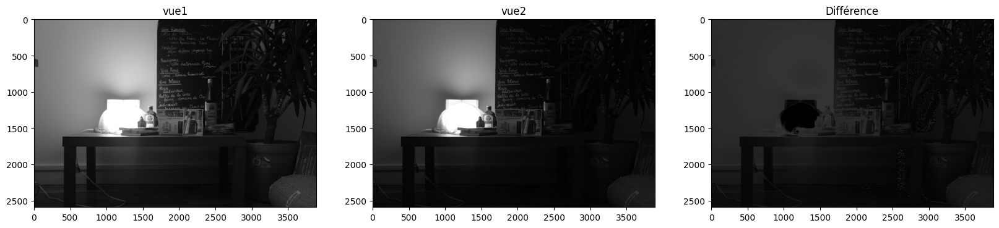

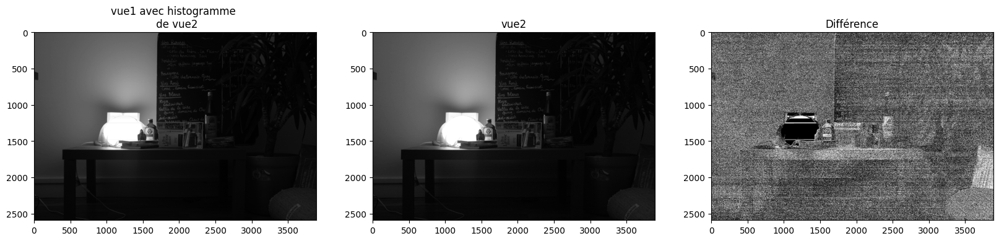

In [7]:
u = skio.imread('vue1.tif')
v = skio.imread('vue2.tif')

ushape=u.shape
uligne=u.reshape((-1,))

vligne=v.reshape((-1,))
ind=np.argsort(uligne)
unew=np.zeros(uligne.shape,uligne.dtype)
unew[ind]=np.sort(vligne)
unew=unew.reshape(ushape)

val_abs_diff = np.abs(u-v)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20,20))
axs[0].imshow(u, cmap="gray")
axs[1].imshow(v, cmap="gray")
axs[2].imshow(val_abs_diff, cmap="gray")
axs[0].set_title('vue1')
axs[1].set_title('vue2')
axs[2].set_title('Différence')

val_abs_diff = np.abs(unew-v)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20,20))
axs[0].imshow(unew, cmap="gray")
axs[1].imshow(v, cmap="gray")
axs[2].imshow(val_abs_diff, cmap="gray")
axs[0].set_title('vue1 avec histogramme \n de vue2')
axs[1].set_title('vue2')
axs[2].set_title('Différence')

*A-t-on
un moyen plus simple d’obtenir le même résultat (donner le même histogramme aux deux images),
dans le cas particulier de ces deux images?*

Text(0.5, 1.0, 'Histogramme de v donné à u')

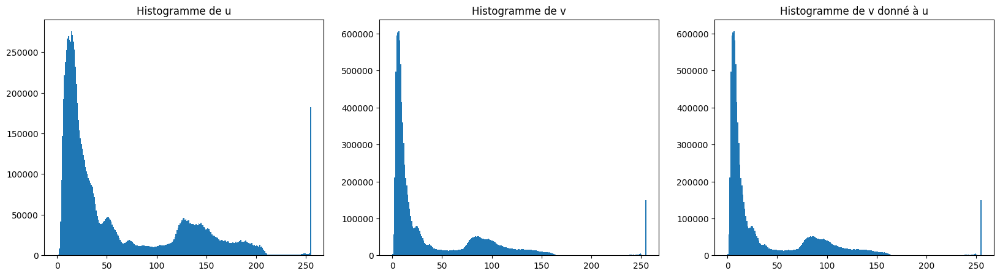

In [8]:
## Code pour donner l'histogramme de l'image v à l'image u

index = np.argsort(u.reshape((-1,)))
unew.reshape((-1,))[index] = np.sort(v.reshape((-1,)))

## Plot

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
axs[0].hist(u.reshape((-1,)),bins=255)
axs[1].hist(v.reshape((-1,)),bins=255)
axs[2].hist(unew.reshape((-1,)),bins=255)
axs[0].set_title('Histogramme de u')
axs[1].set_title('Histogramme de v')
axs[2].set_title('Histogramme de v donné à u')

*En vous inspirant des deux lignes de code ci-dessus, donnez un code simple permettant d’égaliser
l’histogramme d’une image (le rendre aussi proche que possible d’une fonction constante).*

Text(0.5, 1.0, 'Image 3')

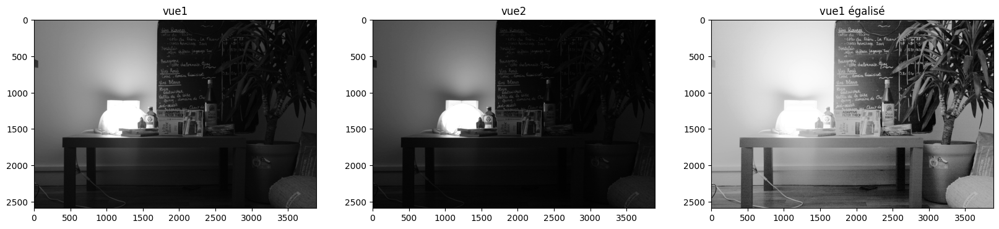

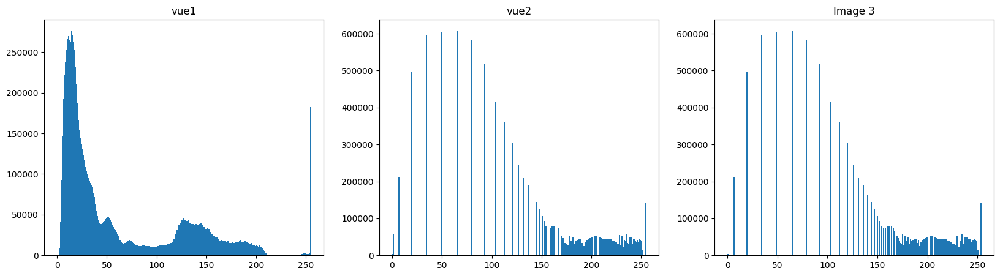

In [9]:
## Égalisation de v

(histo,bins)=np.histogram(v.reshape((-1,)),np.arange(0,257))
histo=histo/histo.sum()
histocum=histo.cumsum()

imequal = histocum[np.uint8(v)]*255

## Code pour donner l'histogramme de l'image v égalisé à l'image u

index1 = np.argsort(u.reshape((-1,)))
unew.reshape((-1,))[index1] = np.sort(imequal.reshape((-1,)))

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
axs[0].imshow(u, cmap="gray")
axs[1].imshow(v, cmap="gray")
axs[2].imshow(unew.reshape(ushape), cmap="gray")
axs[0].set_title('vue1')
axs[1].set_title('vue2')
axs[2].set_title('vue1 égalisé')

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
axs[0].hist(u.reshape((-1,)),bins=255)
axs[1].hist(imequal.reshape((-1,)),bins=255)
axs[2].hist(unew.reshape((-1,)),bins=255)
axs[0].set_title('vue1')
axs[1].set_title('vue2')
axs[2].set_title('Image 3')

**3.5 Dithering**

*Le dithering (ou détramage) est une technique utilisée à l’origine pour obtenir un rendu en niveaux de
gris lorsque l’appareil d’impression ne disposait que de deux couleurs (noir et blanc). A l’aide de la
fonction quantize , observez l’effet d’une quantification de plus en plus brutale sur une image.*

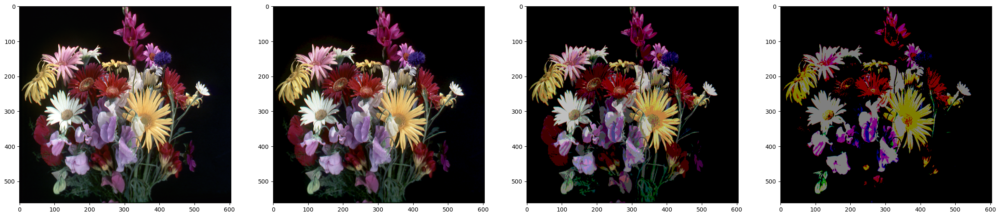

In [10]:
im3_5 = skio.imread('fleur.tif')

imt1 = quantize(im3_5, 2)
imt2 = quantize(im3_5, 4)
imt3 = quantize(im3_5, 20)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(30, 30))
axs[0].imshow(im3_5.astype("uint8"))
axs[1].imshow(imt3.astype("uint8"))
axs[2].imshow(imt2.astype("uint8"))
axs[3].imshow(imt1.astype("uint8"))
axs[0].set_title('')
axs[1].set_title('')
axs[2].set_title('')
axs[3].set_title('')

fig.savefig('3_5.png', bbox_inches="tight")



*Pour comprendre la méthode du dithering, commencez par seuiller une image (avec seuil ) et visualisez le résultat. Appliquez le même seuillage à une version bruitée de l’image originale et visualisez.*

(562, 604, 3) (562, 604, 3)


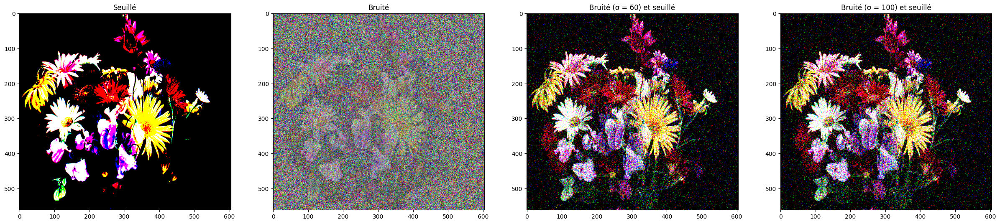

In [11]:
im3_5 = skio.imread('fleur.tif')

im3_5s = seuil(im3_5, 130)
print(im3_5.shape, im3_5s.shape)
im3_5noise = noise(im3_5,60)
im3_5s_noise = seuil(im3_5noise, 130)

im3_5noise2 = noise(im3_5,100)
im3_5s_noise2 = seuil(im3_5noise, 130)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(30, 30))
axs[0].imshow(im3_5s.astype("uint8"))
axs[1].imshow(im3_5noise.astype("uint8"))
axs[2].imshow(im3_5s_noise.astype("uint8"))
axs[3].imshow(im3_5s_noise2.astype("uint8"))
axs[0].set_title('Seuillé')
axs[1].set_title('Bruité')
axs[2].set_title('Bruité (σ = 60) et seuillé')
axs[3].set_title('Bruité (σ = 100) et seuillé')

fig.savefig('3_51.png', bbox_inches="tight")



*Que constatez vous?*

En observant les images, il est possible de constater que l'image simplement seuillé est considerablement moins nette que les images qui ont reçu du bruit gaussien avant le seuillage, selon le principe du dithering.

*En considérant un pixel de niveau x dans l’image initiale, donnez la probabilité pour que ce pixel
soit blanc après ajout de bruit et seuillage.*

18.904810162381278


Text(0.5, 1.0, 'Image 3')

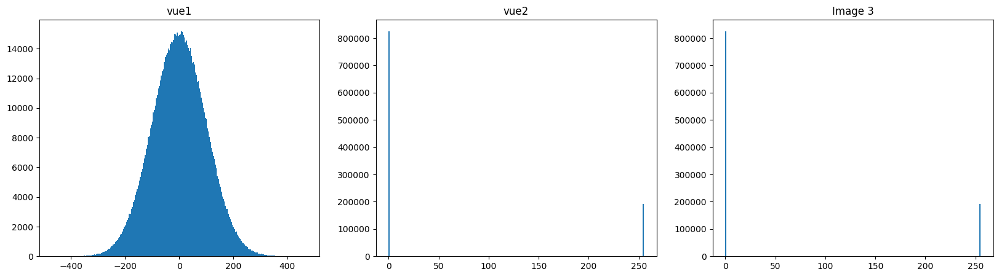

In [12]:
imt=np.float32(im3_5.copy())
sh=imt.shape
bruit=100*np.random.randn(*sh)


nMax= np.count_nonzero(im3_5s_noise==255)
probMax=nMax/(im3_5s_noise.size)

print(probMax*100)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
axs[0].hist(bruit.reshape((-1,)),bins=255)
axs[1].hist(im3_5s_noise.reshape((-1,)),bins=255)
axs[2].hist(im3_5s_noise2.reshape((-1,)),bins=255)
axs[0].set_title('vue1')
axs[1].set_title('vue2')
axs[2].set_title('Image 3')


*Pourquoi l’image détramée ressemble-t-elle plus à l’image
de départ que l’image simplement seuillée?*


.

**3.6 Différences de niveaux de grix voisins**

*On veut maintenant étudier la statistique de la différence de niveau de gris entre deux pixels adjacents. Gràce à la commande gradx on peut obtenir une image de la différence entre pixels adjacents.
Visualisez l’histogramme d’une telle image. Visualisez le logarithme de l’histogramme.*

<ipython-input-13-6d95b005a33e>:10: RuntimeWarning: divide by zero encountered in log
  axs[3].plot(np.log(np.histogram(gradx(im3_6),255)[0]))


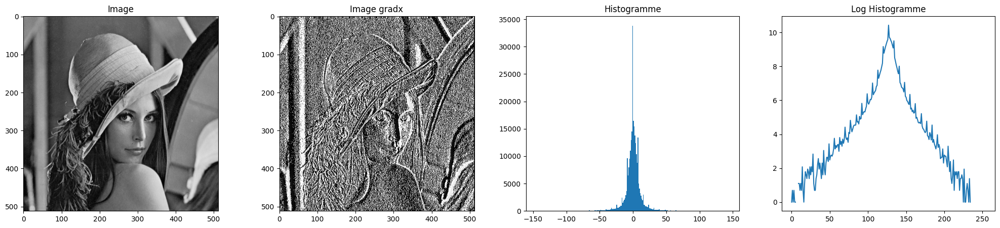

In [13]:
im3_6 = skio.imread('lena.tif')
im3_6grad = gradx(im3_6)

(histo,bins)=np.histogram(im3_6grad.reshape((-1,)),np.arange(0,256))

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(25, 5))
axs[0].imshow(im3_6.astype("uint8"), cmap="gray")
axs[1].imshow(im3_6grad.astype("uint8"), cmap="gray")
axs[2].hist(im3_6grad.reshape((-1,)),bins=255)
axs[3].plot(np.log(np.histogram(gradx(im3_6),255)[0]))
axs[0].set_title('Image')
axs[1].set_title('Image gradx')
axs[2].set_title('Histogramme')
axs[3].set_title('Log Histogramme')

fig.savefig('3_6.png', bbox_inches="tight")


*La distribution des différences vous semble-t-elle obéir a une loi gaussienne ? Pourquoi ? Quelle
aurait été la forme de l’histogramme si l’on avait considéré la différences entre pixels plus éloignés?
(On ne demande pas de faire l’expérience).*

.

**4.1 Visualisation de spectres**

Gràce à la fonction view_spectre on peut visualiser le spectre d’une image. Visualisez les spectres
de différentes images en utilisant les options 1 et 2 ( help(view_spectre) ).


Que constatez-vous? Qu’en déduisez-vous par rapport au spectre d’une image? (Pour la suite on
visualisera toujours avec l’option 2)


Text(0.5, 1.0, 'Spectre sans Hamming')

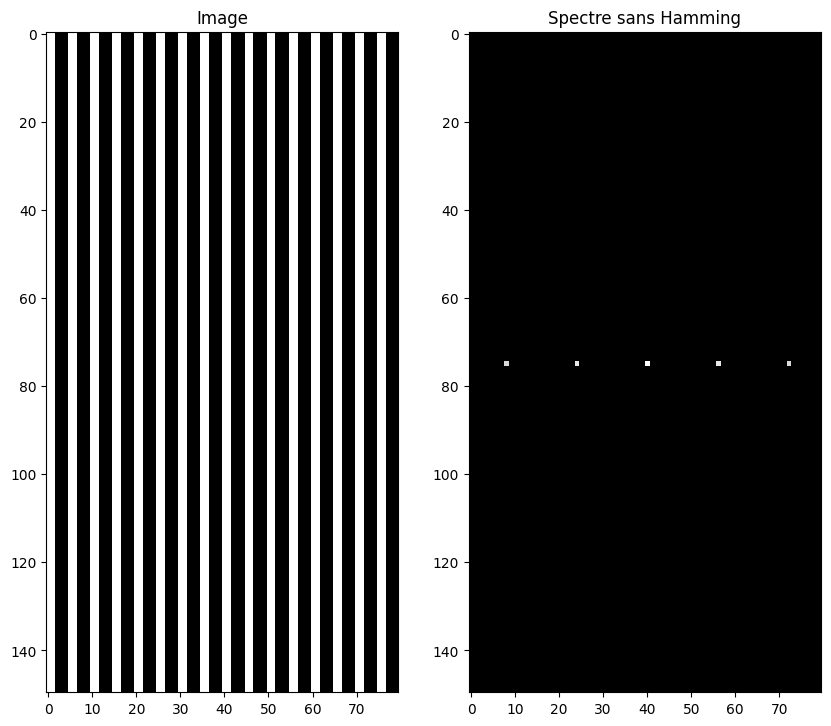

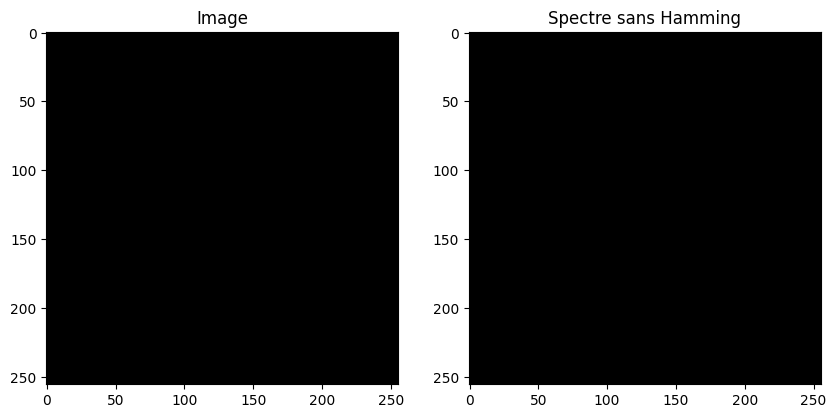

In [14]:
im4_1=skimage.io.imread('rayures.tif')

FS = view_spectre(im4_1[100:250, 0:80],2,False)
FS1 = view_spectre(np.zeros(im4_1.shape),2,False)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 10))
axs[0].imshow(im4_1[100:250, 0:80].astype("uint8"), cmap="gray")
axs[1].imshow(FS, cmap='gray')
axs[0].set_title('Image')
axs[1].set_title('Spectre sans Hamming')

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 10))
axs[0].imshow(np.zeros(im4_1.shape), cmap="gray")
axs[1].imshow(FS1, cmap='gray')
axs[0].set_title('Image')
axs[1].set_title('Spectre sans Hamming')


Comment influe l’option hamming sur le spectre de l’image? (multiplication de l’image originale
par une fonction très lisse qui s’annule aux bords de l’image)


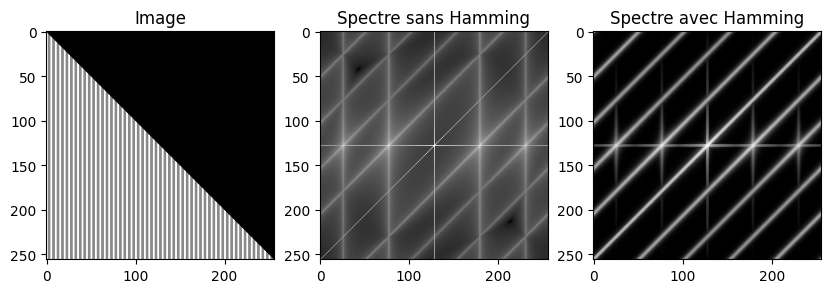

In [15]:

FS = view_spectre(im4_1,2,False)
FS1 = view_spectre(im4_1,2,True)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 10))
axs[0].imshow(im4_1.astype("uint8"), cmap="gray")
axs[1].imshow(FS, cmap='gray')
axs[2].imshow(FS1, cmap='gray')
axs[0].set_title('Image')
axs[1].set_title('Spectre sans Hamming')
axs[2].set_title('Spectre avec Hamming')

fig.savefig('4_11.png', bbox_inches="tight")



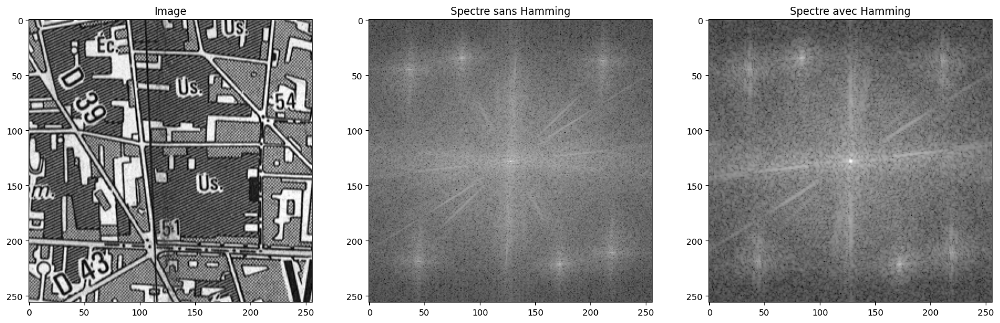

In [16]:
im4_2=skimage.io.imread('carte_nb.tif')

FS = view_spectre(im4_2,2,False)
FS1 = view_spectre(im4_2,2,True)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
axs[0].imshow(im4_2.astype("uint8"), cmap="gray")
axs[1].imshow(FS, cmap='gray')
axs[2].imshow(FS1, cmap='gray')
axs[0].set_title('Image')
axs[1].set_title('Spectre sans Hamming')
axs[2].set_title('Spectre avec Hamming')

fig.savefig('4_12.png', bbox_inches="tight")


**4.2 Ringing**

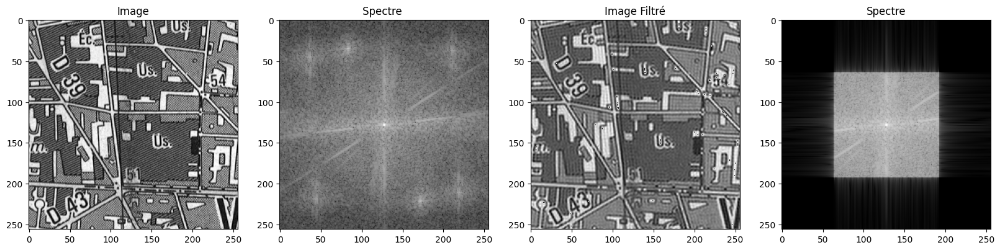

In [17]:
im4_2=skimage.io.imread('carte_nb.tif')

FS = view_spectre(im4_2,2,True)

im = filterlow(im4_2)

FS1 = view_spectre(im,2,True)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 20))
axs[0].imshow(im4_2.astype("uint8"), cmap="gray")
axs[1].imshow(FS, cmap='gray')
axs[2].imshow(im.astype("uint8"), cmap='gray')
axs[3].imshow(FS1, cmap='gray')
axs[0].set_title('Image')
axs[1].set_title('Spectre ')
axs[2].set_title('Image Filtré')
axs[3].set_title('Spectre')

fig.savefig('4_21.png', bbox_inches="tight")


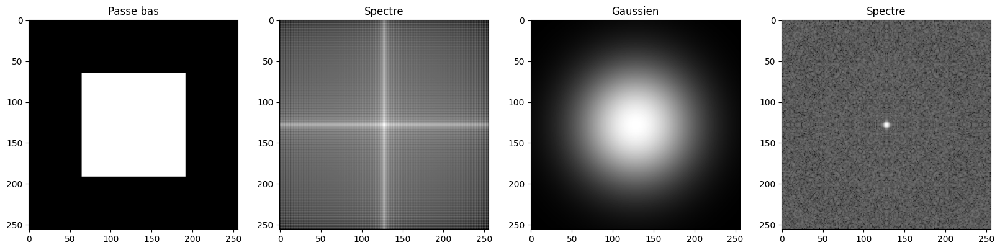

In [18]:
im4_21=skimage.io.imread('masque_bas_centre.tif')
im4_22=skimage.io.imread('masque_gauss_centre.tif')

FS = view_spectre(im4_21,2,True)
FS1 = view_spectre(im4_22,2,True)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 20))
axs[0].imshow(im4_21.astype("uint8"), cmap="gray")
axs[1].imshow(FS, cmap='gray')
axs[2].imshow(im4_22.astype("uint8"), cmap='gray')
axs[3].imshow(FS1, cmap='gray')
axs[0].set_title('Passe bas')
axs[1].set_title('Spectre')
axs[2].set_title('Gaussien')
axs[3].set_title('Spectre')

fig.savefig('4_22.png', bbox_inches="tight")
